# Automatically generating object masks with SAM

[![image](https://studiolab.sagemaker.aws/studiolab.svg)](https://studiolab.sagemaker.aws/import/github/opengeos/segment-geospatial/blob/main/docs/examples/automatic_mask_generator.ipynb)
[![image](https://img.shields.io/badge/Open-Planetary%20Computer-black?style=flat&logo=microsoft)](https://pccompute.westeurope.cloudapp.azure.com/compute/hub/user-redirect/git-pull?repo=https://github.com/opengeos/segment-geospatial&urlpath=lab/tree/segment-geospatial/docs/examples/automatic_mask_generator.ipynb&branch=main)
[![image](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/opengeos/segment-geospatial/blob/main/docs/examples/automatic_mask_generator.ipynb)

This notebook shows how to segment objects from an image using the Segment Anything Model (SAM) with a few lines of code.

Make sure you use GPU runtime for this notebook. For Google Colab, go to `Runtime` -> `Change runtime type` and select `GPU` as the hardware accelerator.

The notebook is adapted from [segment-anything/notebooks/automatic_mask_generator_example.ipynb](https://github.com/opengeos/segment-anything/blob/pypi/notebooks/automatic_mask_generator_example.ipynb), but I have made it much easier to save the segmentation results and visualize them.

## Install dependencies

Uncomment and run the following cell to install the required dependencies.

In [66]:
%pip install segment-geospatial

Note: you may need to restart the kernel to use updated packages.


In [67]:
import os
import leafmap
from samgeo import SamGeo, show_image, download_file, overlay_images, tms_to_geotiff

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

## Create an interactive map

In [68]:
m = leafmap.Map(center=[37.8713, -122.2580], zoom=17, height="800px")
m.add_basemap("SATELLITE")
m

Map(center=[37.8713, -122.258], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'z…

In [69]:
if m.user_roi_bounds() is not None:
    bbox = m.user_roi_bounds()
else:
    bbox = [-122.2659, 37.8682, -122.2521, 37.8741]

## Download a sample image

In [70]:
# from osgeo import gdal
image = "satellite.tif"
tms_to_geotiff(output=image, bbox=bbox, zoom=17, source="Satellite", overwrite=True)

Exception ignored in: <bound method IPythonKernel._clean_thread_parent_frames of <ipykernel.ipkernel.IPythonKernel object at 0x1132698d0>>
Traceback (most recent call last):
  File "/Users/trangttdang/Documents/NJIT/CS370/cs370-assignments/.conda/lib/python3.11/site-packages/ipykernel/ipkernel.py", line 770, in _clean_thread_parent_frames
    def _clean_thread_parent_frames(

KeyboardInterrupt: 


Downloaded image 01/24
Downloaded image 02/24
Downloaded image 03/24
Downloaded image 04/24
Downloaded image 05/24
Downloaded image 06/24
Downloaded image 07/24
Downloaded image 08/24
Downloaded image 09/24
Downloaded image 10/24
Downloaded image 11/24
Downloaded image 12/24
Downloaded image 13/24
Downloaded image 14/24
Downloaded image 15/24
Downloaded image 16/24
Downloaded image 17/24
Downloaded image 18/24
Downloaded image 19/24
Downloaded image 20/24
Downloaded image 21/24
Downloaded image 22/24
Downloaded image 23/24
Downloaded image 24/24
Saving GeoTIFF. Please wait...
Image saved to satellite.tif


You can also use your own image. Uncomment and run the following cell to use your own image.

In [ ]:
image = './satellite.tif'

Display the downloaded image on the map.

In [ ]:
pip install xarray

Note: you may need to restart the kernel to use updated packages.


In [ ]:
m.layers[-1].visible = False
m.add_raster(image, layer_name="Image")
m

Map(bottom=12958516.0, center=[37.8713, -122.258], controls=(ZoomControl(options=['position', 'zoom_in_text', …

## Initialize SAM class

Specify the file path to the model checkpoint. If it is not specified, the model will to downloaded to the working directory.

In [ ]:
sam = SamGeo(
    model_type="vit_h",
    sam_kwargs=None,
)

## Automatic mask generation

Segment the image and save the results to a GeoTIFF file. Set `unique=True` to assign a unique ID to each object.

In [ ]:
sam.generate(image, output="masks.tif", foreground=True, unique=True)

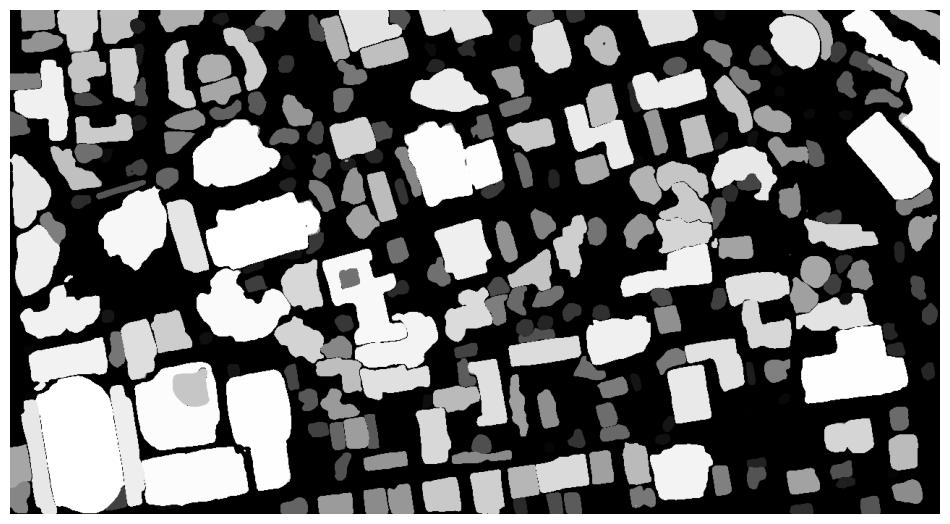

In [ ]:
sam.show_masks(cmap="binary_r")

Show the object annotations (objects with random color) on the map.

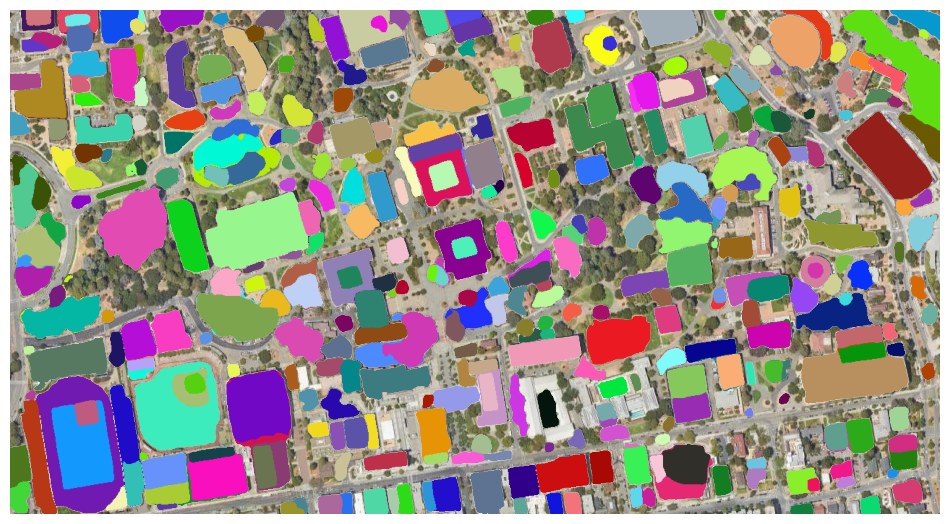

In [ ]:
sam.show_anns(axis="off", alpha=1, output="annotations.tif")

Compare images with a slider.


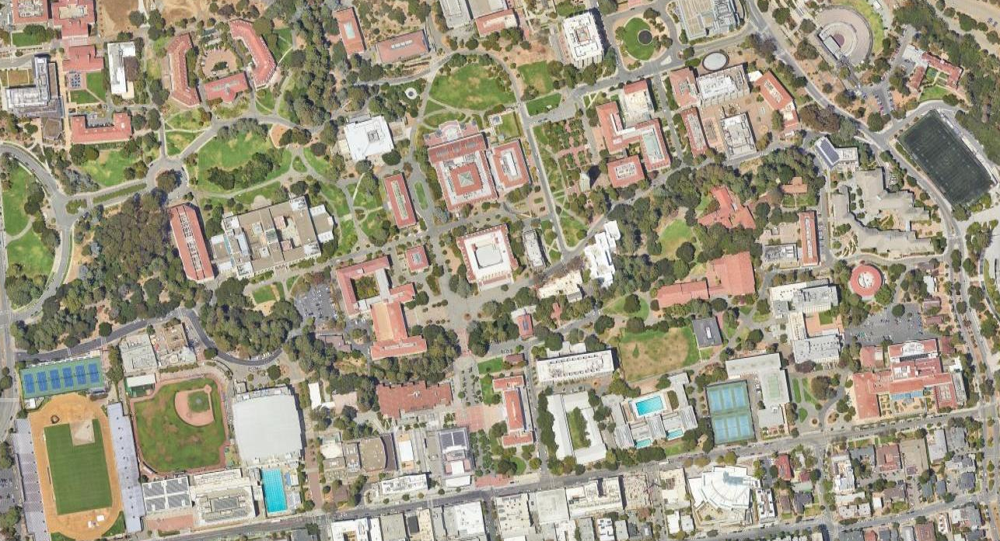
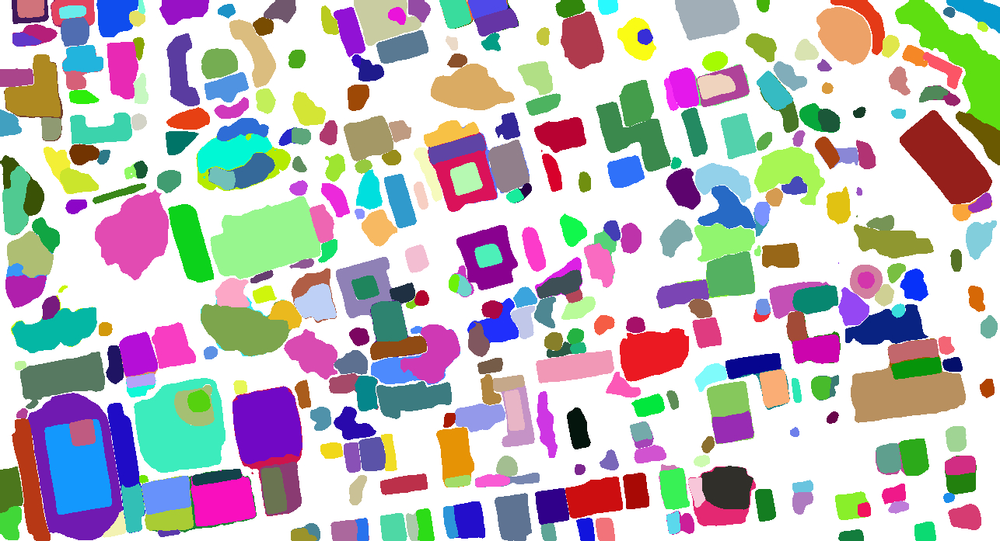

In [ ]:
leafmap.image_comparison(
    "satellite.tif",
    "annotations.tif",
    label1="Satellite Image",
    label2="Image Segmentation",
)

Add image to the map.

In [ ]:
m.add_raster("annotations.tif", alpha=0.5, layer_name="Masks")
m

Map(bottom=3239933.0, center=[37.87115, -122.259], controls=(ZoomControl(options=['position', 'zoom_in_text', …

Convert the object annotations to vector format, such as GeoPackage, Shapefile, or GeoJSON.

In [ ]:
sam.tiff_to_vector("masks.tif", "masks.gpkg")

## Automatic mask generation options

There are several tunable parameters in automatic mask generation that control how densely points are sampled and what the thresholds are for removing low quality or duplicate masks. Additionally, generation can be automatically run on crops of the image to get improved performance on smaller objects, and post-processing can remove stray pixels and holes. Here is an example configuration that samples more masks:

In [ ]:
sam_kwargs = {
    "points_per_side": 32,
    "pred_iou_thresh": 0.86,
    "stability_score_thresh": 0.92,
    "crop_n_layers": 1,
    "crop_n_points_downscale_factor": 2,
    "min_mask_region_area": 100,
}

In [ ]:
sam = SamGeo(
    model_type="vit_h",
    sam_kwargs=sam_kwargs,
)

In [ ]:
sam.generate(image, output="masks2.tif", foreground=True)

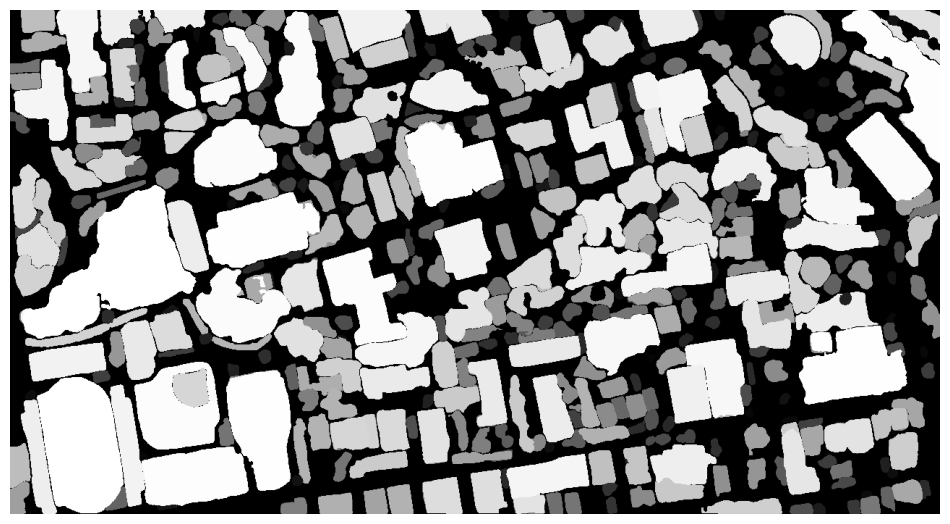

In [ ]:
sam.show_masks(cmap="binary_r")

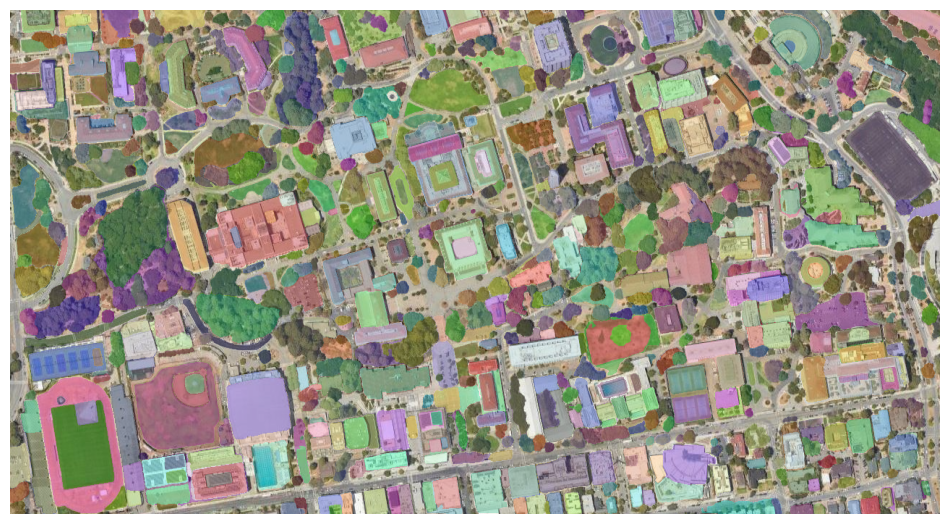

In [ ]:
sam.show_anns(axis="off", opacity=1, output="annotations2.tif")

Compare images with a slider.


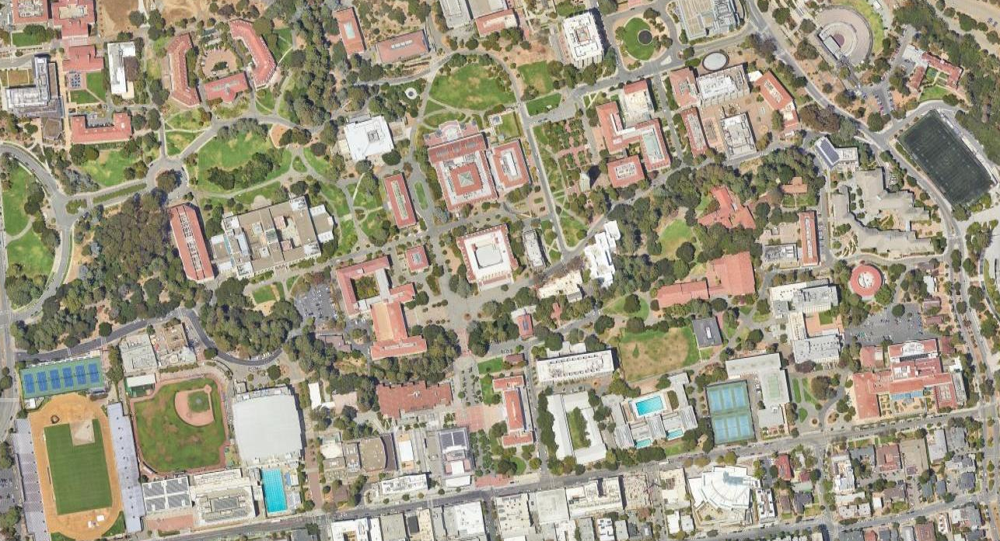
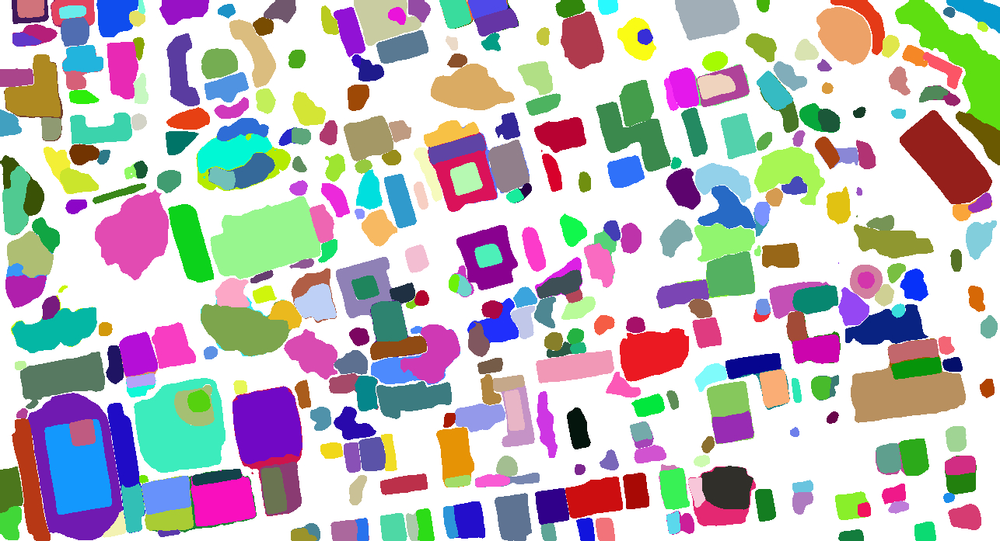

In [ ]:
leafmap.image_comparison(
    image,
    "annotations.tif",
    label1="Image",
    label2="Image Segmentation",
)

Overlay the annotations on the image and use the slider to change the opacity interactively.

In [ ]:
overlay_images(image, "annotations2.tif", backend="TkAgg")

![](https://i.imgur.com/I1IhDgz.gif)

# Milestone 3

In [3]:
!pip install datasets
!pip install matplotlib

  Using cached datasets-2.19.0-py3-none-any.whl.metadata (19 kB)
  Using cached filelock-3.13.4-py3-none-any.whl.metadata (2.8 kB)
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.1/61.1 kB 4.7 MB/s eta 0:00:00
  Using cached pyarrow_hotfix-0.6-py3-none-any.whl.metadata (3.6 kB)
  Using cached dill-0.3.8-py3-none-any.whl.metadata (10 kB)
  Using cached requests-2.31.0-py3-none-any.whl.metadata (4.6 kB)
  Using cached tqdm-4.66.2-py3-none-any.whl.metadata (57 kB)
  Using cached fsspec-2024.3.1-py3-none-any.whl.metadata (6.8 kB)
  Using cached huggingface_hub-0.22.2-py3-none-any.whl.metadata (12 kB)
  Using cached aiosignal-1.3.1-py3-none-any.whl.metadata (4.0 kB)
  Using cached attrs-23.2.0-py3-none-any.whl.metadata (9.5 kB)
  Using cached idna-3.7-py3-none-any.whl.metadata (9.9 kB)
  Using cached urllib3-2.2.1-py3-none-any.whl.metadata (6.4 kB)
  Using cached certifi-2024.2.2-py3-none-any.whl.metadata (2.2 kB)
  Using cached pytz-2024.1-py2.py3-none-any.whl.metadata (22 kB)
  Using cac

In [4]:
# Install the required libraries
#SAM
!pip install git+https://github.com/facebookresearch/segment-anything.git
#Transformers
!pip install -q git+https://github.com/huggingface/transformers.git
#Datasets to prepare data and monai if you want to use special loss functions
!pip install datasets
!pip install -q monai

  Cloning https://github.com/facebookresearch/segment-anything.git to /private/var/folders/4l/snj_h6gd22d69fjtw6fx1jgr0000gn/T/pip-req-build-n080xau_
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/segment-anything.git /private/var/folders/4l/snj_h6gd22d69fjtw6fx1jgr0000gn/T/pip-req-build-n080xau_
  Resolved https://github.com/facebookresearch/segment-anything.git to commit 6fdee8f2727f4506cfbbe553e23b895e27956588
  Preparing metadata (setup.py) ... done
  Created wheel for segment_anything: filename=segment_anything-1.0-py3-none-any.whl size=36590 sha256=e3e5241fc5d6144fe4b9089c928b066973d8006ab283b02c9fdf45291d69b64d
  Stored in directory: /private/var/folders/4l/snj_h6gd22d69fjtw6fx1jgr0000gn/T/pip-ephem-wheel-cache-n0dkvtb7/wheels/d5/11/03/7aca746a2c0e09f279b10436ced7175926bc38f650b736a648
Successfully built segment_anything


In [100]:
import matplotlib.pyplot as plt
import io
from PIL import Image
import numpy as np

In [101]:
from datasets import load_dataset
train_dataset = load_dataset("back2classroom/sidewalks", split='train', streaming=False)
val_dataset = load_dataset("back2classroom/sidewalks", split='val', streaming=False)
#print(next(iter(train_dataset)))

In [102]:
print(train_dataset)

Dataset({
    features: ['filename', 'tfw', 'tif', 'label_tif', 'label_tfw'],
    num_rows: 180000
})


In [103]:
hex_data = train_dataset[411]['tif']
hex_mask = train_dataset[411]['label_tif']

(256, 256)
(256, 256)


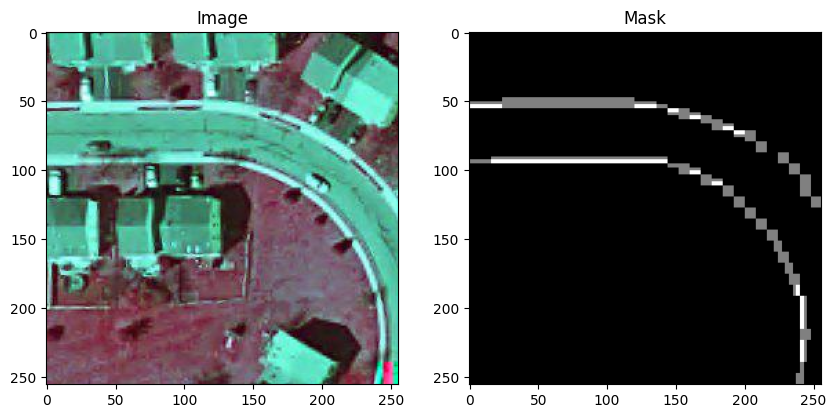

In [104]:
# Assuming hex_data contains the binary data of the first image
# Assuming hex_mask contains the binary data of the second mask image
# Define hex_data and hex_mask here...

fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Open a BytesIO object to treat the binary data as a file-like object for the first image
image_stream = io.BytesIO(hex_data)
# Open the first image using PIL
image = Image.open(image_stream)
print(image.size)
# gray_image = image.convert('L')
# Display the first image in the first subplot
axes[0].imshow(image)
axes[0].set_title('Image')

# Open a BytesIO object to treat the binary data as a file-like object for the second mask image
mask_stream = io.BytesIO(hex_mask)
# Open the second mask image using PIL
mask = Image.open(mask_stream)
print(np.array(mask).shape)
# Display the second mask image in the second subplot
axes[1].imshow(mask, cmap='gray')
axes[1].set_title('Mask')

plt.show()


In [ ]:

valid_indices = []
for i in range(len(train_dataset)):
    data = train_dataset[i]
    hex_mask = data['label_tif']
    # Decode hex data into an image
    image = Image.open(io.BytesIO(hex_mask))

    # Convert image to grayscale for simplicity
    grayscale_image = image.convert('L')

    # Get the width and height of the image
    width, height = grayscale_image.size

    # Flag to check if image is totally black
    totally_black = True

    # Iterate through each pixel to check if it's black
    for y in range(height):
        for x in range(width):
            pixel_value = grayscale_image.getpixel((x, y))
            if pixel_value != 0:  # Check if the pixel is not black
                totally_black = False
                break
        if not totally_black:
            break
    if totally_black == False:
        valid_indices.append(i)
        # print("The image is not totally black.")



In [13]:
# import json
# # Path to the JSON file
# file_path = "valid_indices.json"

# # Write the list to the JSON file
# with open(file_path, "w") as json_file:
#     json.dump(valid_indices, json_file)

In [105]:
import json

with open('valid_indices.json', 'r') as f:
    valid_indices = json.load(f)

In [106]:
print(len(valid_indices))
print(len(train_dataset))

88863
180000


In [107]:
from datasets import Dataset
# Filter out entries based on valid indices
filtered_train_dataset = train_dataset.select(valid_indices[::20])

# Rename columns
filtered_train_dataset = filtered_train_dataset.rename_column('tif', 'image')
filtered_train_dataset = filtered_train_dataset.rename_column('label_tif', 'label')
filtered_train_dataset = filtered_train_dataset.select_columns(['image', 'label'])
# Display the new dataset
print(filtered_train_dataset)

Dataset({
    features: ['image', 'label'],
    num_rows: 4444
})


In [7]:
# Initialize lists to hold converted images and labels
converted_train_images = []
converted_train_labels = []

# Iterate over the dataset using indices every tenth
for i in range(len(filtered_train_dataset)): #range(0, len(filtered_train_dataset), 10):
    data = filtered_train_dataset[i]
    hex_image = data['image']
    hex_mask = data['label']
    # Decode hex data into an image
    image = Image.open(io.BytesIO(hex_image))
    mask = Image.open(io.BytesIO(hex_mask))
    image_arr = np.array(image)
    mask_arr = np.array(mask)
    converted_train_images.append(image_arr)
    converted_train_labels.append(mask_arr)
    # filtered_train_dataset[i]['image'] = image_arr
    # filtered_train_dataset[i]['label'] = mask_arr

In [ ]:
converted_dict = {
    "image": converted_train_images,
    "label": converted_train_labels
}
converted_train_dataset = Dataset.from_dict(converted_dict)

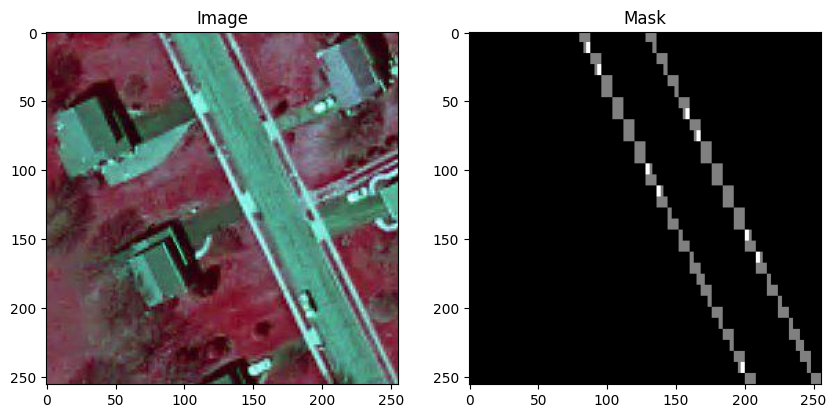

In [21]:
# Assuming hex_data contains the binary data of the first image
# Assuming hex_mask contains the binary data of the second mask image
# Define hex_data and hex_mask here...

fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Display the first image in the first subplot
axes[0].imshow(converted_train_images[411])
axes[0].set_title('Image')

# Display the second mask image in the second subplot
axes[1].imshow(converted_train_labels[411], cmap='gray')
axes[1].set_title('Mask')

plt.show()


In [108]:
#Get bounding boxes from mask.
def get_bounding_box(ground_truth_map):
  # get bounding box from mask
  y_indices, x_indices = np.where(ground_truth_map > 0)
  x_min, x_max = np.min(x_indices), np.max(x_indices)
  y_min, y_max = np.min(y_indices), np.max(y_indices)
  # add perturbation to bounding box coordinates
  H, W = ground_truth_map.shape
  x_min = max(0, x_min - np.random.randint(0, 20))
  x_max = min(W, x_max + np.random.randint(0, 20))
  y_min = max(0, y_min - np.random.randint(0, 20))
  y_max = min(H, y_max + np.random.randint(0, 20))
  bbox = [x_min, y_min, x_max, y_max]
  return bbox

In [109]:
from torch.utils.data import Dataset

class SAMDataset(Dataset):
  """
  This class is used to create a dataset that serves input images and masks.
  It takes a dataset and a processor as input and overrides the __len__ and __getitem__ methods of the Dataset class.
  """
  def __init__(self, dataset, processor):
    self.dataset = dataset
    self.processor = processor

  def __len__(self):
    return len(self.dataset)

  def __getitem__(self, idx):
    item = self.dataset[idx]
    # image = item["image"]
    ground_truth_mask = np.array(item["label"])
    image = np.array(Image.open(io.BytesIO(item["image"])))
    ground_truth_mask = np.array(Image.open(io.BytesIO(item["label"])))

    # get bounding box prompt
    prompt = get_bounding_box(ground_truth_mask)

    # prepare image and prompt for the model
    inputs = self.processor(image, input_boxes=[[prompt]], return_tensors="pt")

    # remove batch dimension which the processor adds by default
    inputs = {k:v.squeeze(0) for k,v in inputs.items()}

    # add ground truth segmentation
    inputs["ground_truth_mask"] = ground_truth_mask

    return inputs

In [110]:
# Initialize the processor
from transformers import SamProcessor
with open("preprocessor_config.json", "r") as f:
    preprocessor_config = json.load(f)

# Initialize the processor
from transformers import SamProcessor
processor = SamProcessor.from_pretrained("facebook/sam-vit-base", 
                                        **preprocessor_config)

In [111]:
# Create an instance of the SAMDataset
custom_train_dataset = SAMDataset(dataset=filtered_train_dataset, processor=processor)

In [113]:
print(len(custom_train_dataset))

4444


In [115]:
import numpy as np
example = custom_train_dataset[0]
for k,v in example.items():
  print(k,v.shape)

pixel_values torch.Size([3, 1024, 1024])
original_sizes torch.Size([2])
reshaped_input_sizes torch.Size([2])
input_boxes torch.Size([1, 4])
ground_truth_mask (256, 256)


In [116]:
# Create a DataLoader instance for the training dataset
from torch.utils.data import DataLoader
train_dataloader = DataLoader(custom_train_dataset, batch_size=2, shuffle=True, drop_last=False)

In [117]:
# Load the model
from transformers import SamModel
model = SamModel.from_pretrained("facebook/sam-vit-base")

# make sure we only compute gradients for mask decoder
for name, param in model.named_parameters():
  if name.startswith("vision_encoder") or name.startswith("prompt_encoder"):
    param.requires_grad_(False)

In [118]:
from torch.optim import Adam
import monai
# Initialize the optimizer and the loss function
optimizer = Adam(
    model.mask_decoder.parameters(),
    lr=1e-5,  # Initial learning rate
    weight_decay=0.01,
    betas=(0.9, 0.999),  # Momentum coefficients
    eps=1e-08,  # Term added to the denominator to improve numerical stability
    amsgrad=False  # Use the AMSGrad variant of the optimizer
)
#Try DiceFocalLoss, FocalLoss, DiceCELoss
seg_loss = monai.losses.FocalLoss(gamma=2.0, alpha=None, weight=None, reduction='mean', use_softmax=False)

In [ ]:
from tqdm import tqdm
from statistics import mean
import torch
from torch.nn.functional import threshold, normalize
from monai.metrics import compute_iou

#Training loop
num_epochs = 1

device = "cuda" if torch.cuda.is_available() else "cpu"
model.to(device)

model.train()
for epoch in range(num_epochs):
    epoch_losses = []
    epoch_ious = []
    for batch in tqdm(train_dataloader):
      # forward pass
      outputs = model(pixel_values=batch["pixel_values"].to(device),
                      input_boxes=batch["input_boxes"].to(device),
                      multimask_output=False)

      # compute loss
      predicted_masks = outputs.pred_masks.squeeze(1)
      ground_truth_masks = batch["ground_truth_mask"].float().to(device)

      sam_masks_prob = torch.sigmoid(predicted_masks)
      sam_masks_prob = sam_masks_prob.squeeze()
      sam_masks = (sam_masks_prob > 0.5)

      loss = seg_loss(predicted_masks, ground_truth_masks.unsqueeze(1))
      ious = compute_iou(sam_masks.unsqueeze(1),
                        ground_truth_masks.unsqueeze(1), ignore_empty=False)
      epoch_ious.append(ious.mean())
      print(f'iou: {ious.mean()}')
      print(f'loss: {loss}')
      # backward pass (compute gradients of parameters w.r.t. loss)
      optimizer.zero_grad()
      loss.backward()

      # optimize
      optimizer.step()
      epoch_losses.append(loss.item())

    print(f'EPOCH: {epoch}')
    print(f'Mean loss: {mean(epoch_losses)}')
    print(f'Mean IOU: {mean(epoch_ious)}')

In [20]:
# Specify the filename
filename = "sam_model.pth"

# Save the model's state dictionary to the current directory
torch.save(model.state_dict(), filename)

### Inference

In [119]:
from transformers import SamModel, SamConfig, SamProcessor
import torch

##### Trained on HPC - sammodel2.pth

In [6]:
# Load the model configuration
model_config = SamConfig.from_pretrained("facebook/sam-vit-base")
with open("preprocessor_config.json", "r") as f:
    preprocessor_config = json.load(f)

# Initialize the processor
from transformers import SamProcessor
processor = SamProcessor.from_pretrained("facebook/sam-vit-base", 
                                        **preprocessor_config)

# Create an instance of the model architecture with the loaded configuration
my_sam_model = SamModel(config=model_config)
#Update the model by loading the weights from saved file.
my_sam_model.load_state_dict(torch.load("sammodel2.pth", map_location=torch.device('cpu')))

<All keys matched successfully>

In [14]:
# set the device to cuda if available, otherwise use cpu
device = "cuda" if torch.cuda.is_available() else "cpu"
my_sam_model.to(device)

SamModel(
  (shared_image_embedding): SamPositionalEmbedding()
  (vision_encoder): SamVisionEncoder(
    (patch_embed): SamPatchEmbeddings(
      (projection): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
    )
    (layers): ModuleList(
      (0-11): 12 x SamVisionLayer(
        (layer_norm1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (attn): SamVisionAttention(
          (qkv): Linear(in_features=768, out_features=2304, bias=True)
          (proj): Linear(in_features=768, out_features=768, bias=True)
        )
        (layer_norm2): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (mlp): SamMLPBlock(
          (lin1): Linear(in_features=768, out_features=3072, bias=True)
          (lin2): Linear(in_features=3072, out_features=768, bias=True)
          (act): GELUActivation()
        )
      )
    )
    (neck): SamVisionNeck(
      (conv1): Conv2d(768, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (layer_norm1): SamLayerNorm()
     

1700


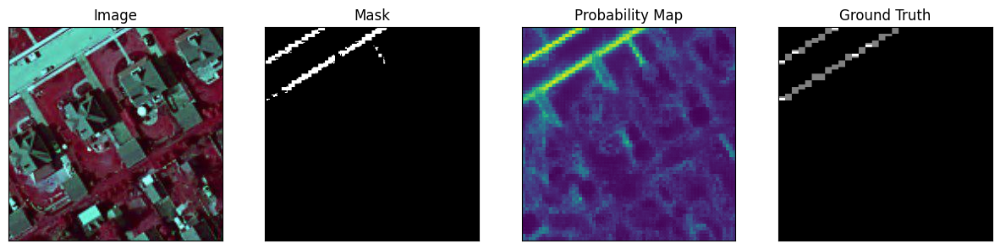

In [106]:
import numpy as np
import random
import torch
import matplotlib.pyplot as plt

# let's take a random training example
idx = random.randint(0, len(filtered_train_dataset))
print(idx)

# load image
test_image = np.array(Image.open(io.BytesIO(filtered_train_dataset[idx]["image"])))

# get box prompt based on ground truth segmentation map
ground_truth_mask = np.array(Image.open(io.BytesIO(filtered_train_dataset[idx]["label"])))
prompt = get_bounding_box(ground_truth_mask)

# prepare image + box prompt for the model
inputs = processor(test_image, input_boxes=[[prompt]], return_tensors="pt")

# Move the input tensor to the GPU if it's not already there
inputs = {k: v.to(device) for k, v in inputs.items()}

my_sam_model.eval()

# forward pass
with torch.no_grad():
    outputs = my_sam_model(**inputs, multimask_output=False)

# apply sigmoid
medsam_seg_prob = torch.sigmoid(outputs.pred_masks.squeeze(1))
# convert soft mask to hard mask
medsam_seg_prob = medsam_seg_prob.cpu().numpy().squeeze()
medsam_seg = (medsam_seg_prob > 0.5).astype(np.uint8)


fig, axes = plt.subplots(1, 4, figsize=(15, 5))

# Plot the first image on the left
axes[0].imshow(np.array(test_image), cmap='gray')  # Assuming the first image is grayscale
axes[0].set_title("Image")

# Plot the second image on the right
axes[1].imshow(medsam_seg, cmap='gray')  # Assuming the second image is grayscale
axes[1].set_title("Mask")

# Plot the second image on the right
axes[2].imshow(medsam_seg_prob)  # Assuming the second image is grayscale
axes[2].set_title("Probability Map")

axes[3].imshow(ground_truth_mask, cmap='gray')  # Assuming the second image is grayscale
axes[3].set_title("Ground Truth")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Display the images side by side
plt.show()


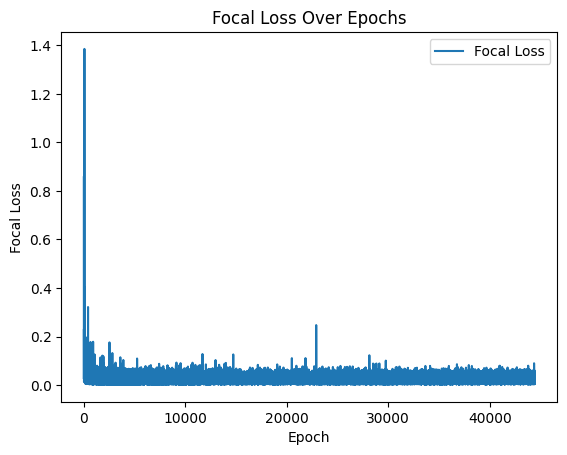

In [59]:
import matplotlib.pyplot as plt

# Read loss values from the file, plotting every 100th line
with open("losses.txt", "r") as file:
    losses = []
    for i, line in enumerate(file):
        losses.append(float(line.strip()))

# Plot the loss values
plt.plot(losses, label='Focal Loss')
plt.title('Focal Loss Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Focal Loss')
plt.legend()
plt.show()


In [61]:
import statistics
# Calculate the mean
mean_losses = statistics.mean(losses)

# Print the mean
print("Mean Loss:", mean_losses)

# Read the content of the file, remove "iou" prefix, filter out values > 1.0 and non-zero values
with open("iou.txt", "r") as file:
    iou_values = [line.strip().replace("iou: ", "") for line in file]
    iou_values = [float(value) for value in iou_values]

# Calculate the mean
mean_iou = statistics.mean(iou_values)

# Print the mean
print("Mean IoU:", mean_iou)

Mean Loss: 0.02694225992987006
Mean IoU: 0.9111671512336065


### Validate model - Unseen data

In [81]:
print(val_dataset)

Dataset({
    features: ['filename', 'tfw', 'tif', 'label_tif', 'label_tfw'],
    num_rows: 19999
})


In [ ]:

valid_test_indices = []
for i in range(len(val_dataset)):
    data = val_dataset[i]
    hex_mask = data['label_tif']
    # Decode hex data into an image
    image = Image.open(io.BytesIO(hex_mask))

    # Convert image to grayscale for simplicity
    grayscale_image = image.convert('L')

    # Get the width and height of the image
    width, height = grayscale_image.size

    # Flag to check if image is totally black
    totally_black = True

    # Iterate through each pixel to check if it's black
    for y in range(height):
        for x in range(width):
            pixel_value = grayscale_image.getpixel((x, y))
            if pixel_value != 0:  # Check if the pixel is not black
                totally_black = False
                break
        if not totally_black:
            break
    if totally_black == False:
        valid_test_indices.append(i)

# import json
# # Path to the JSON file
# file_path = "valid_test_indices.json"

# # Write the list to the JSON file
# with open(file_path, "w") as json_file:
#     json.dump(valid_test_indices, json_file)

In [83]:
import json

with open('valid_test_indices.json', 'r') as f:
    valid_test_indices = json.load(f)

from datasets import Dataset
# Filter out entries based on valid indices
filtered_test_dataset = val_dataset.select(valid_test_indices)

# Rename columns
filtered_test_dataset = filtered_test_dataset.rename_column('tif', 'image')
filtered_test_dataset = filtered_test_dataset.rename_column('label_tif', 'label')
filtered_test_dataset = filtered_test_dataset.select_columns(['image', 'label'])
# Display the new dataset
print(filtered_test_dataset)

Dataset({
    features: ['image', 'label'],
    num_rows: 10082
})


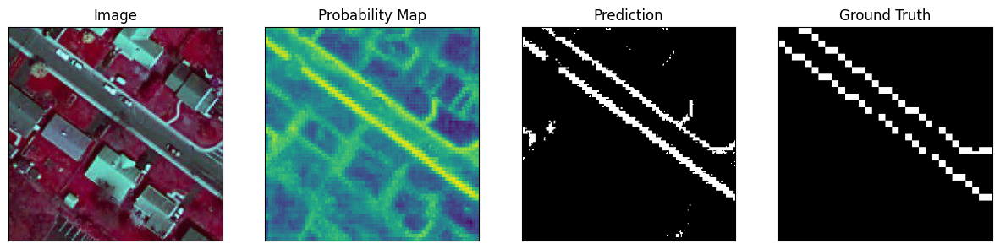

In [88]:
import random

idx = random.randint(0, len(filtered_test_dataset))

new_image = np.array(Image.open(io.BytesIO(filtered_test_dataset[idx]["image"])))
new_mask = np.array(Image.open(io.BytesIO(filtered_test_dataset[idx]["label"])))

#First try without providing any prompt (no bounding box or input_points)
#inputs = processor(single_patch, return_tensors="pt")
#Now try with bounding boxes. Remember to uncomment.
# inputs = processor(new_image, input_points=input_points, return_tensors="pt")
inputs = processor(new_image, return_tensors="pt")


# Move the input tensor to the GPU if it's not already there
inputs = {k: v.to(device) for k, v in inputs.items()}
my_sam_model.eval()


# forward pass
with torch.no_grad():
  outputs = my_sam_model(**inputs, multimask_output=False)

# apply sigmoid
single_patch_prob = torch.sigmoid(outputs.pred_masks.squeeze(1))
# convert soft mask to hard mask
single_patch_prob = single_patch_prob.cpu().numpy().squeeze()
single_patch_prediction = (single_patch_prob > 0.5).astype(np.uint8)


fig, axes = plt.subplots(1, 4, figsize=(15, 5))

# Plot the first image on the left
axes[0].imshow(new_image, cmap='gray')  # Assuming the first image is grayscale
axes[0].set_title("Image")

# Plot the second image on the right
axes[1].imshow(single_patch_prob)  # Assuming the second image is grayscale
axes[1].set_title("Probability Map")

# Plot the second image on the right
axes[2].imshow(single_patch_prediction, cmap='gray')  # Assuming the second image is grayscale
axes[2].set_title("Prediction")

axes[3].imshow(new_mask, cmap='gray')  # Assuming the second image is grayscale
axes[3].set_title("Ground Truth")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Display the images side by side
plt.show()

In [34]:
from PIL import Image

def resize_image(input_path, size=(256, 256)):
    try:
        # Open the image file
        with Image.open(input_path) as img:
            # Resize the image
            resized_img = img.resize(size)
            return resized_img
    except Exception as e:
        print(f"Error: {e}")



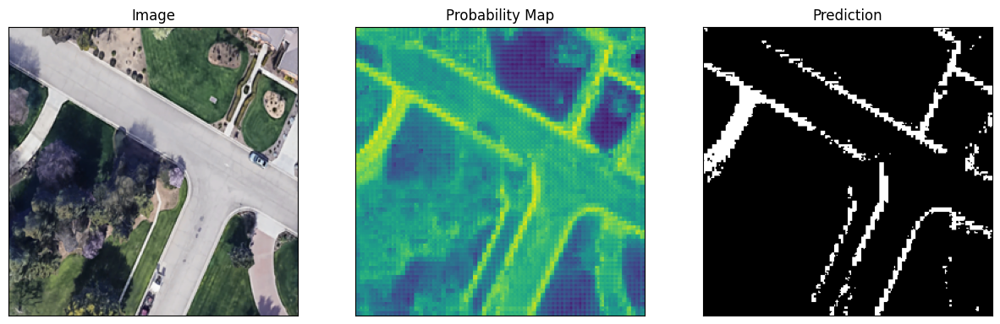

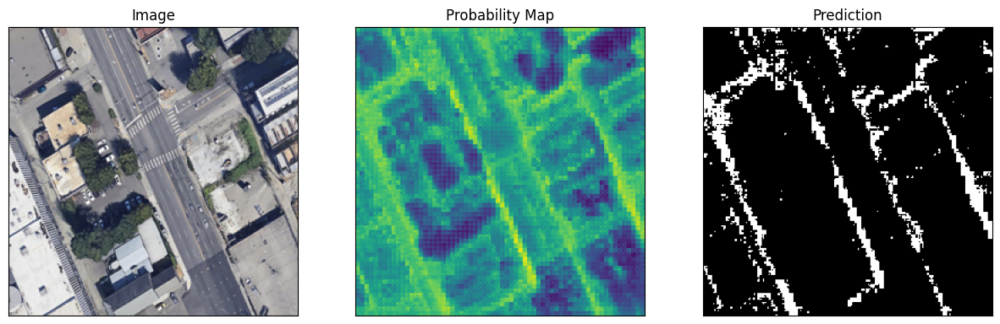

In [63]:
import os

# Define the directory containing your images
image_directory = "../test/"

# Get a list of all image files in the directory
image_files = [file for file in os.listdir(image_directory) if file.endswith('.png')]

# Loop through each image file
for image_file in image_files:
    # Construct the full path to the image
    input_image_path = os.path.join(image_directory, image_file)
    
    # Resize the image
    resized_image = resize_image(input_image_path)
    new_image = np.array(resized_image.convert("RGB"))

    # Prepare inputs for the model
    inputs = processor(new_image, return_tensors="pt")
    inputs = {k: v.to(device) for k, v in inputs.items()}
    my_sam_model.eval()

    # Forward pass
    with torch.no_grad():
        outputs = my_sam_model(**inputs, multimask_output=False)

    # Apply sigmoid
    single_patch_prob = torch.sigmoid(outputs.pred_masks.squeeze(1))
    single_patch_prob = single_patch_prob.cpu().numpy().squeeze()
    single_patch_prediction = (single_patch_prob > 0.5).astype(np.uint8)

    # Plotting
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))

    axes[0].imshow(new_image)
    axes[0].set_title("Image")

    axes[1].imshow(single_patch_prob)
    axes[1].set_title("Probability Map")

    axes[2].imshow(single_patch_prediction, cmap='gray')
    axes[2].set_title("Prediction")

    for ax in axes:
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_xticklabels([])
        ax.set_yticklabels([])

    plt.show()

# Milestone 4
### Demo link: https://drive.google.com/file/d/1-9OibZRBjVW_rYmGxyCcm235GcYzs7mX/view?usp=drive_link
### Deployed using Shiny on Hugging Face: https://huggingface.co/spaces/ttd22/segment-anything-model 